In [16]:
import torch
from torch.autograd import Variable
from torch.autograd import Function
from torchvision import models
from torchvision import utils
import cv2
import sys
import numpy as np
import argparse
import torch.nn as nn
import ntpath
from gradcam import GradCam, GuidedBackpropReLUModel, preprocess_image, show_cam_on_image
from tqdm import tqdm
import time
import os

## Adopt the code(https://github.com/jacobgil/pytorch-grad-cam) to compute [CAM](http://cnnlocalization.csail.mit.edu/) and [Grad-CAM](http://gradcam.cloudcv.org/)

In [ ]:
cd visualization/train/Deformed/

In [ ]:
import os
import random
import sys
import shutil
import errno
import subprocess


#walk_dir = 'Large dataset/Gut deformations/Normal'
#target_file_prefix = 'n'
#label = 'Normal'

walk_dir = '/home/ycharn/gut/dataset/train/Normal'
#target_file_prefix = 'd'
#label = 'Deformed'


print('walk_dir = ' + walk_dir)

# If your current orking directory may change during script execution, it's recommended to
# immediately convert program arguments to an absolute path. Then the variable root below will
# be an absolute path as well. Example:
# walk_dir = os.path.abspath(walk_dir)
print('walk_dir (absolute) = ' + os.path.abspath(walk_dir))

file_path_ary = []
for root, subdirs, files in os.walk(walk_dir):
    for f in files:
        if f[-4:] != '.txt' and f[-4:] != 'tore':
            #print('{}'.format(os.path.join(root, f)))
            file_path_ary.append((f, os.path.join(root, f)))

for i, path in (enumerate(file_path_ary)):
    cmd = 'python ../../../gradcam.py --use-cuda --image-path={}'.format(path[1])
    try:
        result = subprocess.check_output(cmd, shell=True)
    except subprocess.CalledProcessError, e:
        result = subprocess.check_output(cmd, shell=True)
    result = result.split('\n')[1]
    print('file {}, in {} prediction: {}'.format(path[0], path[1], result))
    time.sleep(.3)

In [ ]:
cd ../../../visualization/train/Deformed/

In [ ]:
#walk_dir = 'Large dataset/Gut deformations/Normal'
#target_file_prefix = 'n'
#label = 'Normal'

#walk_dir = 'Large dataset/Gut deformations/Normal'
#target_file_prefix = 'n'
#label = 'Normal'

walk_dir = '/home/ycharn/gut/dataset/train/Deformed'
#target_file_prefix = 'd'
#label = 'Deformed'


print('walk_dir = ' + walk_dir)

# If your current orking directory may change during script execution, it's recommended to
# immediately convert program arguments to an absolute path. Then the variable root below will
# be an absolute path as well. Example:
# walk_dir = os.path.abspath(walk_dir)
print('walk_dir (absolute) = ' + os.path.abspath(walk_dir))

file_path_ary = []
for root, subdirs, files in os.walk(walk_dir):
    for f in files:
        if f[-4:] != '.txt' and f[-4:] != 'tore':
            #print('{}'.format(os.path.join(root, f)))
            file_path_ary.append((f, os.path.join(root, f)))
            
for i, path in (enumerate(file_path_ary)):
    cmd = 'python ../../../gradcam.py --use-cuda --image-path={}'.format(path[1])
    try:
        result = subprocess.check_output(cmd, shell=True)
    except subprocess.CalledProcessError, e:
        result = subprocess.check_output(cmd, shell=True)
    result = result.split('\n')[1]
    print('file {}, in {} prediction: {}'.format(path[0], path[1], result))
    time.sleep(.3)

## Processing the log

In [ ]:
cd ../../../

In [8]:
file_logs = []
with open('visualization_logs', 'r') as f:
    for cnt, line in enumerate(f):
        #print("Line {}: {}".format(cnt, line.strip()))
        if line.strip() != '':
            fields = line.strip().split(' ')
            if len(fields) < 4:
                continue
            file_logs.append((fields[3], fields[-1].split('\t')))

## Visualization

In [44]:
import cv2
import ntpath
import torchvision
import os
import matplotlib.pyplot as plt
% matplotlib inline
np.random.seed(1234)

In [45]:
def visualize(normal_flag=True):
    if normal_flag:
        t_idx = np.random.randint(244, size=10) #0-244 is for normal
        vis_path = 'visualization/train/Normal'
    else:
        t_idx = 245+np.random.randint(156, size=10) #245-401 is for deformed
        vis_path = 'visualization/train/Deformed'
    imgs = []
    title = ''
    for idx in t_idx:
        log = file_logs[idx]
        _, filename = ntpath.split(log[0])
        cam_path = os.path.join(vis_path, '{}_cam.jpg'.format(filename, ))
        grad_cam_path = os.path.join(vis_path, '{}_cam_gb.jpg'.format(filename, ))
        ori_img = cv2.imread(log[0], 1)[:,:,::-1]
        ori_img = np.float32(cv2.resize(ori_img, (224, 224))) / 255
        cam_img = cv2.imread(cam_path, 1)[:,:,::-1]
        cam_img = np.float32(cv2.resize(cam_img, (224, 224))) / 255
        grad_cam_img = cv2.imread(grad_cam_path, 1)[:,:,::-1]
        grad_cam_img = np.float32(cv2.resize(grad_cam_img, (224, 224))) / 255
        title += ('  ' + str(log[1]))
        imgs.append((ori_img, cam_img, grad_cam_img))
    imgs = np.concatenate( ([i[0] for i in imgs], [i[1] for i in imgs], [i[2] for i in imgs])).transpose(0, 3, 1, 2)
    imgs = torch.from_numpy(imgs).float()
    imgs = torchvision.utils.make_grid(imgs, nrow=10)
    imgs = imgs.numpy().transpose((1, 2, 0))
    plt.figure(figsize=(30, 30))
    plt.axis('off')
    plt.title(title, size=18)
    plt.imshow(imgs)

## Output images
1. The first row corresponds to the original image, the second row corresponds to the CAM overlapped on the orignal image, and the third row corresponds to the Grad-CAM image.
2. The title means probability of each class [Deformed, Normal]
3. The next three blocks visualize the image with normal tadpoles, and the last three blocks visualize the deformed tadpoles.

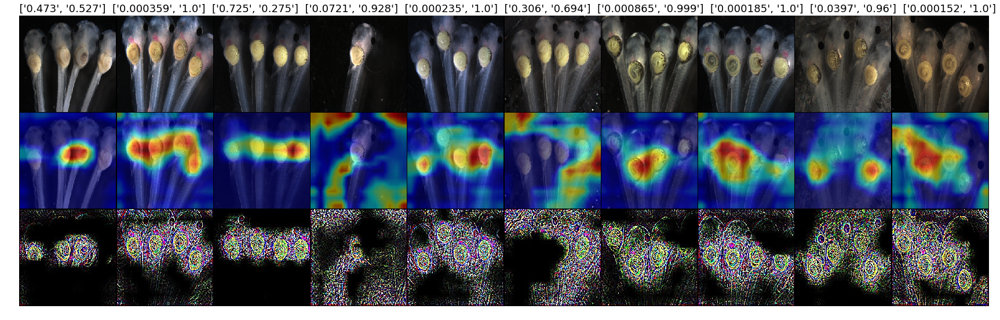

In [46]:
visualize()

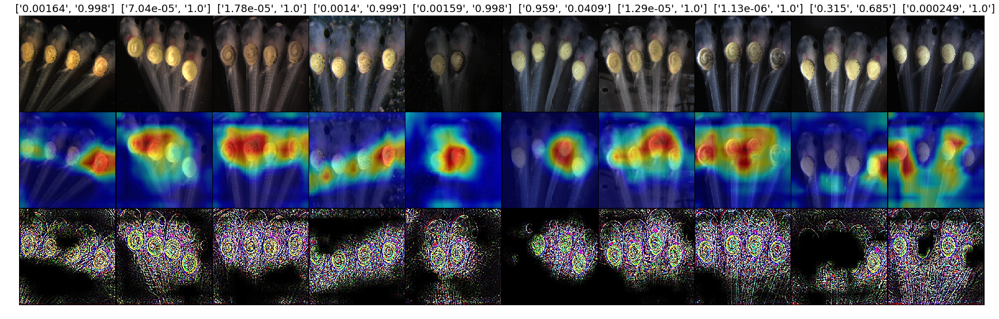

In [47]:
visualize()

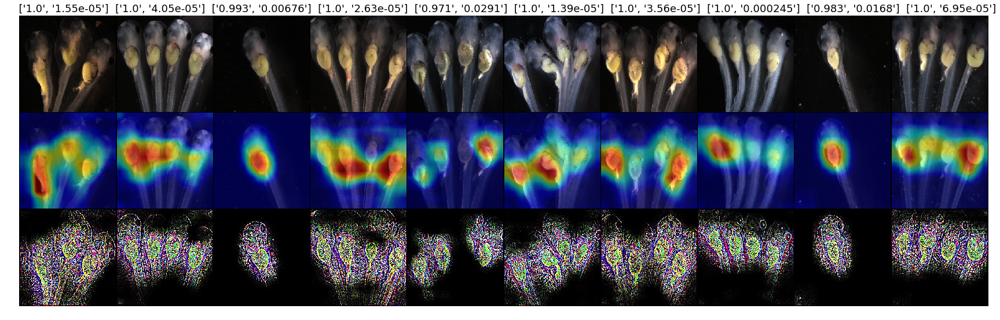

In [48]:
visualize(normal_flag=False)

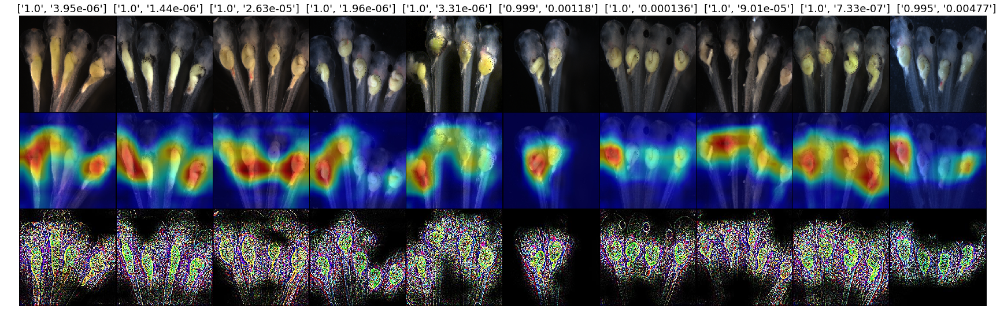

In [49]:
visualize(normal_flag=False)

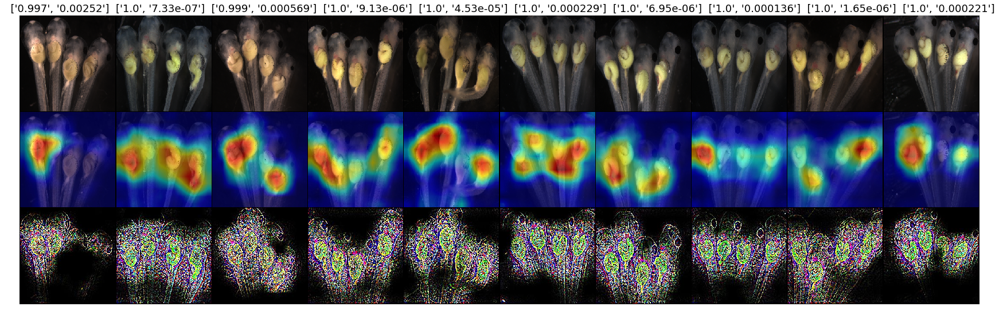

In [50]:
visualize(normal_flag=False)

## Conclusion
1. The visualization shows that in most cases, the model looks at the deformed area to classify.
2. The model does not look at all tadpoles in an image; instead, it usually looks at some tadpoles to classify. This might lead to mis-classification because some tadpoles are hard to classify. It would be best for a model to consider all tadpoles in an image to classify.